<h1 style='color:#00868b'>LDA_v3_imbalanced_more_stopwords<span class="tocSkip"></span></h1>

# Start

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Read and initial clean dataset

In [2]:
df = pd.read_csv("../../complaints-2020-01-22_08_24.csv", encoding="utf-8")

Example of an uncleaned comment:

In [3]:
df["Consumer complaint narrative"][52]

'I BORROWED {$200.00}, IN AN FINANCIAL EMERGENCY, FROM XXXX XXXX XXXX OFFICE IN XXXX, TN, ON XX/XX/2019. THEN ON XXXX XXXX ; AT XXXX XXXX XXXX XXXX, XXXX, XXXX XXXX, IN XXXX XXXX, TN XXXX ; I WAS TOLD MY PAYOFF IS {$210.00}, SO I PAID {$210.00}. HOWEVER, I HAVE BEEN CHARGED MUCH MORE THAN {$210.00}, ON XXXX XXXX, I PAID OFF THE LOAN IN PERSON AND MY CHECKING ACCOUNT WAS ALSO DOUBLE BILLED /CHARGED ANOTHER {$45.00}, IN XXXX , TN. \nTODAY XX/XX/2019 I WENT INTO THE XXXX   XXXX OFFICE, IN XXXX, TN AND ASKED FOR THE REIMBURSEMENT OF MY OVERBILLED MONIES AND THE CLERK NAMED " XXXX \'\' REFUSED TO REFUND MY {$45.00} OVER/ DOUBLE BILLED CHARGES! \n\nXXXX THREATENED TO HAVE ME ARRESTED IF I DID NOT LET THE OFFICE KEEP THE MONIES. MY LOAN OF {$200.00} WAS JUST FOR 40 DAYS, I WAS FORCED TO PAY A TOTAL OF {$260.00}. \nI WAS OVERBILLED/ DOUBLE BILLED {$45.00}'

In [4]:
import re
import string

def clean_document(complaint):
    # turn text to lowercase
    complaint = complaint.lower()
    # remove URLs
    complaint = re.sub('https?://(?:[-\w.]|(?:%[\da-fA-F]{2}))+', '', complaint)
    complaint = re.sub('https? ?: ?// ?(?:[-\w.]|(?:%[\da-fA-F]{2}))+', '', complaint)
    # removed censored words
    complaint = re.sub('[xxxx]{4}', '', complaint)
    complaint = re.sub('[XXXX]{4}', '', complaint)
    # remove normal dates and censored dates
    complaint = re.sub('[\dx]{0,2}/?[\dx]{0,2}/[\dx]{0,4}', '', complaint)
    # remove non-sensical characters
    complaint = re.sub('[\[\,\#\'\"\_\-\(\)\:\$\;\?\%\}\{\@\]\/\.\&\!\|]',' ', complaint)
    complaint = re.sub('\n', '', complaint)
    complaint = re.sub('\t', '', complaint)
    # remove numbers
    complaint = re.sub('[\d]', ' ', complaint)
    # normalise spaces to just one space
    complaint = re.sub(" +", " ", complaint);
    return complaint

In [5]:
df["Consumer complaint narrative"] = df["Consumer complaint narrative"].apply(clean_document)

Example of a cleaned comment:

In [6]:
df["Consumer complaint narrative"][52]

'i borrowed in an financial emergency from office in tn on then on at in tn i was told my payoff is so i paid however i have been charged much more than on i paid off the loan in person and my checking account was also double billed charged another in tn today i went into the office in tn and asked for the reimbursement of my overbilled monies and the clerk named refused to refund my over double billed charges threatened to have me arrested if i did not let the office keep the monies my loan of was just for days i was forced to pay a total of i was overbilled double billed '

In [7]:
df.shape

(485701, 18)

In [8]:
df.head()

,Date received,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,07/23/19,"Credit reporting, credit repair services, or o...",Credit reporting,Credit monitoring or identity theft protection...,Problem canceling credit monitoring or identif...,i have complained many times that the credit r...,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,CA,926XX,None,Consent provided,Web,07/23/19,Closed with explanation,Yes,NaN,3315279
1,07/26/19,Debt collection,I do not know,False statements or representation,Attempted to collect wrong amount,please review the current fraud account and al...,Company believes it acted appropriately as aut...,"Ideal Collection Services, Inc.",FL,333XX,None,Consent provided,Web,07/26/19,Closed with explanation,Yes,NaN,3319487
2,06/03/19,Debt collection,I do not know,Attempts to collect debt not owed,Debt was paid,called multiple times over the years for a deb...,None,"ONEMAIN FINANCIAL HOLDINGS, LLC.",FL,327XX,None,Consent provided,Web,06/07/19,Closed with explanation,Yes,NaN,3262794
3,07/03/19,Debt collection,Other debt,Attempts to collect debt not owed,Debt was result of identity theft,i sent in a letter to the company to have them...,None,"Diversified Consultants, Inc.",VA,232XX,None,Consent provided,Web,07/03/19,Closed with explanation,Yes,NaN,3295208
4,07/14/19,"Credit reporting, credit repair services, or o...",Credit reporting,Improper use of your report,Received unsolicited financial product or insu...,on i applied for a debt relief product from th...,None,"ClearOne Advantage, LLC",PA,191XX,"Older American, Servicemember",Consent provided,Web,07/18/19,Closed with explanation,Yes,NaN,3306130


## Additional preprocessing

### Tokenize words, remove stop words and stem words 

Stemming reduces the variation in text data by converting words to their word stem. Applying stemming allows for LDA to focus much more finely on the base form of a word, rather than focusing on the differences in the various variations of a word. The code below is analagous to sprint 1's code in [<code>lemmatization.py</code>](lemmatization.py).

Stop words include: 
* common English words;
* state names;
* other frequent words that add little to no value to the context.

In [10]:
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re
import string

# use nltk.download('stopwords') to download the list of stop words if this is your first time using nltk
nltk.download('stopwords')

stop_words = nltk.corpus.stopwords.words('english')
my_additional_stop_words = []

# US states, capitalised and lower
states_abbr = ["AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DC", "DE", "FL", "GA", 
          "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD", 
          "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ", 
          "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC", 
          "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"]
states = ["Alabama","Alaska","Arizona","Arkansas","California","Colorado",
  "Connecticut","Delaware","Florida","Georgia","Hawaii","Idaho","Illinois",
  "Indiana","Iowa","Kansas","Kentucky","Louisiana","Maine","Maryland",
  "Massachusetts","Michigan","Minnesota","Mississippi","Missouri","Montana",
  "Nebraska","Nevada","New Hampshire","New Jersey","New Mexico","New York",
  "North Carolina","North Dakota","Ohio","Oklahoma","Oregon","Pennsylvania",
  "Rhode Island","South Carolina","South Dakota","Tennessee","Texas","Utah",
  "Vermont","Virginia","Washington","West Virginia","Wisconsin","Wyoming"]

states_abbr = [item.lower() for item in states_abbr]
states = [item.lower() for item in states]
states.extend(states_abbr)

# add to list of additional stop words
my_additional_stop_words.extend(states)
print("Length of extra list: ", len(my_additional_stop_words))

# add other stop words
my_additional_stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 
                                 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 
                                 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 
                                 'right', 'line', 'even', 'also', 'may', 'take', 'come'])
print("Length of extra list: ", len(my_additional_stop_words))

# add more stop words
my_additional_stop_words.extend(['sent', 'date', 'dates', 'dated', 'state', 'states', 'days', 'years', 'months', 'asks', 
                                 'asked', 'sends', 'makes', 'two', 'three', 'mislead', 'understand', 'understands', 'misleads', 
                                 'can', 'cant', 'way', 'none', 'need', 'taken', 'poor', 'what', 'due', 'let', 'put', 'land', 
                                 'pay', 'paid', 'repay', 'well', 'made', 'make', 'wells', 'chase', 'n', 'ask', 'time', 'back', 
                                 'fargo', 'paypal', 'america', 'us', 'told', 'tell', 'tells', 'contact', 'day', 'month', 'year', 
                                 'citibank', 'citi', 'go', 'goes', 'going', 'said', 'got', 'like', 'likes', 'got', 'gots', 'gotten', 
                                 'liken', 'go', 'goes', 'going', 'number', 'ever', 'never', 'help', 'one', 'ones', 'receive', 
                                 'received', 'receives'])

# add nltk's stop words
my_stop_words = stop_words + my_additional_stop_words
print("Length of my_stop_words list: ", len(my_stop_words))

Length of extra list:  101
Length of extra list:  143
Length of my_stop_words list:  401


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bryan\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [11]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize 
from nltk.corpus import stopwords

ps = PorterStemmer()

i = 0
for ind, complaint in df["Consumer complaint narrative"].items():
    i = i+1
    # Tokenize the complaint and remove stop words
    words = [word for word in complaint.split(' ')
                            if word not in my_stop_words and len(word) > 2] 
    new_words = []
    # Stem the words in the complaint
    for word in words:
        new_words.append(ps.stem(word))
    df["Consumer complaint narrative"][ind] = new_words
    if (i % 10000) == 0:
        print(i)
    if(i == df["Consumer complaint narrative"].shape[0]):
        print("Done.")

# to csv for later use
df.to_csv("corpus_sprint3_cleaned_and_stemmed_v3.csv", index=False)

df.shape

C:\Users\bryan\.conda\envs\ml\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
200000
210000
220000
230000
240000
250000
260000
270000
280000
290000
300000
310000
320000
330000
340000
350000
360000
370000
380000
390000
400000
410000
420000
430000
440000
450000
460000
470000
480000
Done.


(485701, 18)

Example:

In [12]:
df['Consumer complaint narrative'][52]

['borrow',
 'financi',
 'emerg',
 'offic',
 'payoff',
 'howev',
 'charg',
 'much',
 'loan',
 'person',
 'check',
 'account',
 'doubl',
 'bill',
 'charg',
 'anoth',
 'today',
 'went',
 'offic',
 'reimburs',
 'overbil',
 'moni',
 'clerk',
 'name',
 'refus',
 'refund',
 'doubl',
 'bill',
 'charg',
 'threaten',
 'arrest',
 'offic',
 'keep',
 'moni',
 'loan',
 'forc',
 'total',
 'overbil',
 'doubl',
 'bill']

In [13]:
df['Consumer complaint narrative']

0         [complain, time, credit, report, experian, ina...
1         [pleas, review, current, fraud, account, fraud...
2         [call, multipl, time, debt, occur, previou, ma...
3         [letter, compani, valid, debt, special, attach...
4         [appli, debt, relief, product, account, execut...
                                ...                        
485696    [account, payday, loan, complet, request, loan...
485697    [mortgag, discharg, chapter, bankruptci, ago, ...
485698    [financ, unit, auto, credit, payment, motor, l...
485699    [automat, payment, car, loan, fine, print, sup...
485700    [reciev, collect, call, unknown, compani, morn...
Name: Consumer complaint narrative, Length: 485701, dtype: object

We have now turned every complaint into an array of its words.

In [14]:
print("nulls in df:", df["Consumer complaint narrative"].isnull().sum())

nulls in df: 0


### Creating the dictionary and corpus

The two main inputs to our LDA topic model are the Dictionary (id2word) and the corpus. Let's create them ([source](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/)).

We remove rare words and common words based on their document frequency. Below we remove words that appear in less than 20 documents or in more than 50% of the documents.

In [15]:
from gensim.corpora import Dictionary

# Create a dictionary representation of the documents.
id2word = Dictionary(df['Consumer complaint narrative'])

# Filter out words that occur less than 20 documents, or more than 50% of the documents.
id2word.filter_extremes(no_below=20, no_above=0.5)

Finally, we transform the documents to a vectorized form. We simply compute the frequency of each word.

In [16]:
# Bag-of-words representation of the documents.
corpus = [id2word.doc2bow(doc) for doc in df['Consumer complaint narrative']]

Let’s see how many tokens and documents we have to train on.

In [17]:
print('Number of unique tokens: %d' % len(id2word))
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 10198
Number of documents: 485701


Each of the 485701 complaints is now represented as a 10198-dimensional vector, which means our vocabulary has 10198 words. The frequencies stated above (20 and 50% could be finetuned).

We are now ready to apply LDA.

## LDA

### Building the Topic Model

**Parameters**

Parameters ([source](https://radimrehurek.com/gensim/models/ldamulticore.html)):
* alpha (α): Topic smoothing parameter; can be set to an 1D array of length equal to the number of expected topics that expresses our a-priori belief for the each topics’ probability
* eta (η): Word/term smoothing parameter; a scalar for a symmetric prior over topic/word probability

Most topic modeling analyses in the literature ([Blei et al, 2003](https://www.researchgate.net/publication/326505884_Latent_Dirichlet_Allocation_LDA_for_Topic_Modeling_of_the_CFPB_Consumer_Complaints); [Blei and Lafferty, 2009](https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.463.1205&rep=rep1&type=pdf#page=96); [Kaplan and Vakili, 2015](https://onlinelibrary.wiley.com/doi/abs/10.1002/smj.2294); [Blei, 2012](https://dl.acm.org/doi/pdf/10.1145/2133806.2133826)) suggest a value of 0.1 for both of these hyperparameters. This results in semantically meaningful topics. However, these values can also be set to 'auto', meaning we would automatically learn these two parameters.

Other parameters:

* number of topics: The number of topics LDA has to attempt to identify
* iterations: Maximum number of iterations through the corpus when inferring the topic distribution of a corpus
* passes: Number of passes through the corpus during training

([Source](https://radimrehurek.com/gensim/auto_examples/tutorials/run_lda.html)):

<code>chunksize</code> controls how many documents are processed at a time in the training algorithm. Increasing chunksize will speed up training, at least as long as the chunk of documents easily fit into memory. Chunksize can however influence the quality of the model, as discussed in Hoffman and co-authors ([source](https://papers.nips.cc/paper/3902-online-learning-for-latent-dirichlet-allocation.pdf)).

<code>passes</code> controls how often we train the model on the entire corpus. Another word for passes might be “epochs”. <code>iterations</code> is somewhat technical, but essentially it controls how often we repeat a particular loop over each document.

**Optimals number of topics**

Finding the optimal number of topics can be done by building many LDA models with different values of number of topics (k) and pick the one that gives the highest coherence value.

Choosing a ‘k’ that marks the end of a rapid growth of topic coherence usually offers meaningful and interpretable topics. Picking an even higher value can sometimes provide more granular sub-topics.

Seeing the same keywords being repeated in multiple topics, probably indicates that the ‘k’ is too large.

The compute_coherence_values() (see below) trains multiple LDA models and provides the models and their corresponding coherence scores.

**Keyswords and weightage**

We will also look at the **keywords** for each topic and the **weightage** (importance) of each keyword using lda_model.print_topics(). The output below show us what the top 10 keywords are that contribute to a topic. The weights reflect how important a keyword is to that topic.

**Model Perplexity** and **Topic Coherence**

Additionally, the **model perplexity** and **topic coherence** are printed. These provide a convenient measure to judge how good a given topic model is.

**LDA type**

We use **parallelized Latent Dirichlet Allocation** which uses multiprocessing to speed up learning ([source](https://radimrehurek.com/gensim/models/ldamulticore.html)).

In [ ]:
from gensim import corpora, models
from gensim.models import CoherenceModel

# Training parameters
alpha = 0.1
eta = 0.1
#alpha = 'auto'
#eta = 'auto'
chunksize = 2000
iterations = 69
passes = 20

######################
# function that produces LDA models & computes coherence values
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics -2

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    
    # Run model for different values for number of topics
    for num_topics in range(start, limit, step):
        print("Start with number of topics:", num_topics)
        # train
        lda_model = models.LdaMulticore(
                    corpus = corpus,
                    id2word = dictionary,
                    num_topics = num_topics, 
                    passes = passes,
                    iterations = iterations,
                    alpha = alpha, 
                    eta = eta,
                    random_state = 42
                   )
        # append to list of models
        model_list.append(lda_model)
        # save the trained model
        print("Saving the model...")
        lda_model.save("models/v3/lda_model_" + str(num_topics) + "topics")
        # Compute Perplexity
        print("Computing complexity...")
        print('Perplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.
        # Compute Coherence
        print("Computing coherence...")
        coherence_model_lda = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model_lda.get_coherence())
        print('Coherence Score: ', coherence_model_lda.get_coherence())
        # Print the 10 most prominent topics for a given model
        for idx, topic in lda_model.print_topics(-1):
            print('\nTopic: {} \nWords: {}'.format(idx, topic))
        print("************************************************")
        
    return model_list, coherence_values
######################

# Run function (this will take some time)
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=df['Consumer complaint narrative'].tolist(), 
                                                        start=8, 
                                                        step=2,
                                                        limit=30)

Start with number of topics: 8
Saving the model...
Computing complexity...
Perplexity:  -6.654033117788847
Computing coherence...
Coherence Score:  0.5103235518950517

Topic: 0 
Words: 0.016*"court" + 0.015*"file" + 0.013*"law" + 0.010*"complaint" + 0.010*"attorney" + 0.010*"bankruptci" + 0.009*"case" + 0.008*"legal" + 0.008*"record" + 0.008*"document"

Topic: 1 
Words: 0.103*"payment" + 0.052*"loan" + 0.023*"late" + 0.019*"interest" + 0.017*"amount" + 0.015*"balanc" + 0.010*"fee" + 0.009*"monthli" + 0.009*"rate" + 0.008*"charg"

Topic: 2 
Words: 0.066*"call" + 0.020*"phone" + 0.014*"compani" + 0.012*"inform" + 0.010*"tri" + 0.010*"work" + 0.008*"email" + 0.008*"name" + 0.008*"state" + 0.008*"bill"

Topic: 3 
Words: 0.093*"consum" + 0.065*"inform" + 0.057*"ident" + 0.054*"report" + 0.048*"theft" + 0.032*"section" + 0.031*"block" + 0.030*"agenc" + 0.021*"victim" + 0.018*"file"

Topic: 4 
Words: 0.108*"report" + 0.030*"remov" + 0.029*"inform" + 0.025*"disput" + 0.020*"inquiri" + 0.017*"b

**Show the graph for Coherence Scores**

In [ ]:
# Show graph

limit=30; start=8; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

**Print the Coherence Scores**

In [ ]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

### Visualize the topics-keywords

#### PyLDAvis visualisation

We can use the PyLDAvis package to visualize our topics.

[Source](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/)

Each bubble on the left-hand side plot represents a topic. The larger the bubble, the more prevalent is that topic. A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

If you move the cursor over one of the bubbles, the words and bars on the right-hand side will update. These words are the salient keywords that form the selected topic.

Use <code>conda install -c conda-forge pyldavis</code> to install the pyLDAvis package.

**Load the model with the highest coherence score**

In [151]:
from gensim.test.utils import datapath

# load saved model
lda_model34 = models.LdaMulticore.load("models/v3/lda_model_" + str(34) +"topics")

**Topics and keywords for the model with 34 topics**

In [152]:
for idx, topic in lda_model34.print_topics(-1):
            print('\nTopic: {} \nWords: {}'.format(idx, topic))


Topic: 0 
Words: 0.058*"sign" + 0.049*"purchas" + 0.047*"contract" + 0.033*"agreement" + 0.028*"financ" + 0.020*"agre" + 0.017*"sale" + 0.016*"price" + 0.014*"buy" + 0.013*"store"

Topic: 1 
Words: 0.071*"offer" + 0.055*"open" + 0.050*"promot" + 0.040*"bonu" + 0.038*"requir" + 0.023*"term" + 0.017*"mile" + 0.016*"within" + 0.015*"met" + 0.015*"new"

Topic: 2 
Words: 0.152*"report" + 0.119*"credit" + 0.038*"remov" + 0.035*"disput" + 0.032*"inform" + 0.024*"bureau" + 0.017*"file" + 0.017*"equifax" + 0.014*"agenc" + 0.013*"experian"

Topic: 3 
Words: 0.129*"car" + 0.071*"vehicl" + 0.030*"loan" + 0.028*"financ" + 0.020*"auto" + 0.019*"santand" + 0.018*"repossess" + 0.017*"dealership" + 0.015*"purchas" + 0.015*"dealer"

Topic: 4 
Words: 0.033*"access" + 0.032*"email" + 0.030*"onlin" + 0.020*"websit" + 0.016*"inform" + 0.016*"coinbas" + 0.013*"support" + 0.013*"messag" + 0.012*"log" + 0.011*"secur"

Topic: 5 
Words: 0.076*"leas" + 0.069*"financi" + 0.061*"pnc" + 0.023*"return" + 0.021*"apar

**Visualize it**

In [163]:
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model34, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
18    -0.058259  0.007167       1        1  6.466161
12     0.044630  0.010142       2        1  5.806339
2     -0.187207 -0.079980       3        1  5.787275
14     0.225695  0.072444       4        1  5.104091
7      0.128191  0.000271       5        1  4.645429
16     0.107284  0.004846       6        1  4.401039
30     0.068802 -0.091143       7        1  4.252626
23    -0.139626 -0.003453       8        1  3.788112
28     0.126076  0.132164       9        1  3.697233
25    -0.239026  0.062374      10        1  3.645047
24     0.170189  0.076759      11        1  3.547873
20    -0.044263 -0.099303      12        1  3.174241
19     0.024810  0.133802      13        1  3.073597
4     -0.061399 -0.072552      14        1  3.032795
13    -0.010994  0.096118      15        1  3.026221
11    -0.203116 -0.058993      16        1  2.843401
32     0.059442 -0.179759      17        1  2.811900
6      0.086848 -0.107271      18        1  2.769983
22     0.116744 -0.156640      19        1  2.612865
26     0.056411 -0.115281      20        1  2.604857
3      0.112981  0.120135      21        1  2.540841
21    -0.036754  0.159340      22        1  2.427264
17     0.115728 -0.195496      23        1  2.341867
0      0.073530  0.045323      24        1  1.990635
27     0.042797  0.110858      25        1  1.818438
1     -0.013159 -0.070036      26        1  1.730800
8     -0.091949 -0.071196      27        1  1.654458
10    -0.286359 -0.056024      28        1  1.559916
9     -0.066164  0.121081      29        1  1.398143
33    -0.139191  0.109464      30        1  1.282863
15    -0.012648  0.193477      31        1  1.260729
29     0.077630 -0.154315      32        1  1.087180
5      0.040927  0.051581      33        1  1.065617
31    -0.088599  0.004096      34        1  0.750168, topic_info=        Term           Freq          Total Category  logprob  loglift
25   payment  159318.000000  159318.000000  Default  30.0000  30.0000
48    credit  160742.000000  160742.000000  Default  29.0000  29.0000
253     card   85634.000000   85634.000000  Default  28.0000  28.0000
42      bank  117600.000000  117600.000000  Default  27.0000  27.0000
172    check   72658.000000   72658.000000  Default  26.0000  26.0000
..       ...            ...            ...      ...      ...      ...
373   health     272.195984    1537.234619  Topic34  -5.5567   3.1614
136   provid     434.573029   38498.152344  Topic34  -5.0888   0.4086
273  purchas     352.792084   26197.080078  Topic34  -5.2973   0.5851
476    proof     296.312012   12788.257812  Topic34  -5.4718   1.1278
107   inform     313.075836   85411.492188  Topic34  -5.4167  -0.7162

[2232 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
2502      3  0.902874  ****
2502     14  0.069452  ****
5340     27  0.994558   <p>
5193      1  0.092392  <p>i
5193      7  0.002149  <p>i
...     ...       ...   ...
2405     23  0.028633  zero
2405     26  0.000666  zero
2405     31  0.000666  zero
3313      5  0.009015  zone
3313     34  0.978154  zone

[14127 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[19, 13, 3, 15, 8, 17, 31, 24, 29, 26, 25, 21, 20, 5, 14, 12, 33, 7, 23, 27, 4, 22, 18, 1, 28, 2, 9, 11, 10, 34, 16, 30, 6, 32])

**The previous model's bubbles are relatively small and have significant overlap, indicating it might not be good. Load another model.**

In [157]:
from gensim.test.utils import datapath

# load saved model
lda_model14 = models.LdaMulticore.load("models/v3/lda_model_" + str(14) +"topics")

**Topics and keywords for the model with 14 topics**

In [158]:
for idx, topic in lda_model14.print_topics(-1):
            print('\nTopic: {} \nWords: {}'.format(idx, topic))


Topic: 0 
Words: 0.082*"call" + 0.024*"phone" + 0.015*"inform" + 0.013*"email" + 0.011*"spoke" + 0.011*"state" + 0.010*"repres" + 0.009*"custom" + 0.009*"time" + 0.009*"speak"

Topic: 1 
Words: 0.054*"mortgag" + 0.034*"loan" + 0.028*"home" + 0.016*"properti" + 0.016*"modif" + 0.014*"tax" + 0.013*"document" + 0.011*"hous" + 0.010*"foreclosur" + 0.010*"escrow"

Topic: 2 
Words: 0.104*"credit" + 0.102*"report" + 0.025*"inform" + 0.024*"remov" + 0.023*"disput" + 0.016*"bureau" + 0.016*"debt" + 0.014*"letter" + 0.013*"collect" + 0.013*"file"

Topic: 3 
Words: 0.043*"car" + 0.024*"vehicl" + 0.015*"financ" + 0.015*"payment" + 0.011*"loan" + 0.011*"work" + 0.010*"purchas" + 0.010*"credit" + 0.009*"compani" + 0.008*"money"

Topic: 4 
Words: 0.122*"card" + 0.059*"credit" + 0.039*"charg" + 0.018*"purchas" + 0.018*"disput" + 0.013*"capit" + 0.012*"close" + 0.010*"use" + 0.010*"servic" + 0.009*"cancel"

Topic: 5 
Words: 0.026*"insur" + 0.024*"bill" + 0.021*"letter" + 0.016*"servic" + 0.016*"leas" 

**Visualize it**

In [164]:
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model14, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.066818  0.065734       1        1  13.315317
6     -0.093957 -0.029978       2        1   9.571752
2      0.205501 -0.037261       3        1   9.451324
10     0.230711 -0.070289       4        1   8.145453
7     -0.038102  0.162355       5        1   7.736578
4      0.016678  0.118677       6        1   7.070038
3     -0.190364 -0.046545       7        1   6.945457
12    -0.117543  0.194664       8        1   6.159400
13    -0.108510 -0.148823       9        1   5.908785
11     0.156807  0.101795      10        1   5.682074
1     -0.007927 -0.120860      11        1   5.537797
9     -0.074271 -0.167446      12        1   5.037068
8      0.016296  0.004592      13        1   5.007438
5      0.071500 -0.026617      14        1   4.431520, topic_info=        Term           Freq          Total Category  logprob  loglift
253     card   84363.000000   84363.000000  Default  30.0000  30.0000
64    report  100936.000000  100936.000000  Default  29.0000  29.0000
25   payment  153589.000000  153589.000000  Default  28.0000  28.0000
18      loan  113839.000000  113839.000000  Default  27.0000  27.0000
48    credit  162138.000000  162138.000000  Default  26.0000  26.0000
..       ...            ...            ...      ...      ...      ...
579   attach    2266.916260   14499.472656  Topic14  -5.2136   1.2607
107   inform    2690.326172   84443.570312  Topic14  -5.0423  -0.3300
45     charg    2595.445801   67938.796875  Topic14  -5.0782  -0.1484
176  compani    2417.468750   60849.570312  Topic14  -5.1493  -0.1093
72     addit    2243.504150   16345.653320  Topic14  -5.2240   1.1305

[1065 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
5998      2  0.949628      <p>it
5994      1  0.997643  aadvantag
356       1  0.247054        abl
356       2  0.037055        abl
356       3  0.039755        abl
...     ...       ...        ...
165      13  0.003599       work
165      14  0.009102       work
3925      5  0.986171       xoom
3847      7  0.992584       yard
1031      5  0.992611       zell

[4328 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 7, 3, 11, 8, 5, 4, 13, 14, 12, 2, 10, 9, 6])

#### t-SNE clustering chart

We will use the **model with 8 and 14 topics** for these visualisations.

Add package **bokeh** with: <code>conda install bokeh</code>

**Model with 8 topics**

In [247]:
from gensim.test.utils import datapath

# load saved model
lda_model8 = models.LdaMulticore.load("models/v3/lda_model_" + str(8) +"topics")

In [248]:
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import matplotlib.colors as mcolors

n_topics = lda_model8.num_topics

# Get topic weights
topic_weights = []
for row_list in lda_model8[corpus]:
    tmp = np.zeros(n_topics)
    for i, w in row_list:
        tmp[i] = w
    topic_weights.append(tmp)

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2)
tsne_lda = tsne_model.fit_transform(arr)

**Visualisation**

In [249]:
# Plot the Topic Clusters using Bokeh
output_notebook()
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
print(len(mycolors))
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
t = np.arange(n_topics)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...

10


**Model with 14 topics**

In [228]:
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import matplotlib.colors as mcolors

n_topics = lda_model14.num_topics

# Get topic weights
topic_weights = []
for row_list in lda_model14[corpus]:
    tmp = np.zeros(n_topics)
    for i, w in row_list:
        tmp[i] = w
    topic_weights.append(tmp)

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2)
tsne_lda = tsne_model.fit_transform(arr)

**Visualisation**

In [245]:
# Plot the Topic Clusters using Bokeh
output_notebook()
mycolors = np.array([color for name, color in mcolors.XKCD_COLORS.items()])
print(len(mycolors))
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
t = np.arange(n_topics)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num*25])
show(plot)

Loading BokehJS ...

949


#### Word clouds

Although we have already seen the keywords for each topic, a word cloud with the size of the words proportional to the weight is a pleasant sight. Let's print the 10 most prominent words for every topic.

Add package **wordcloud** with: <code>pip install wordcloud</code>

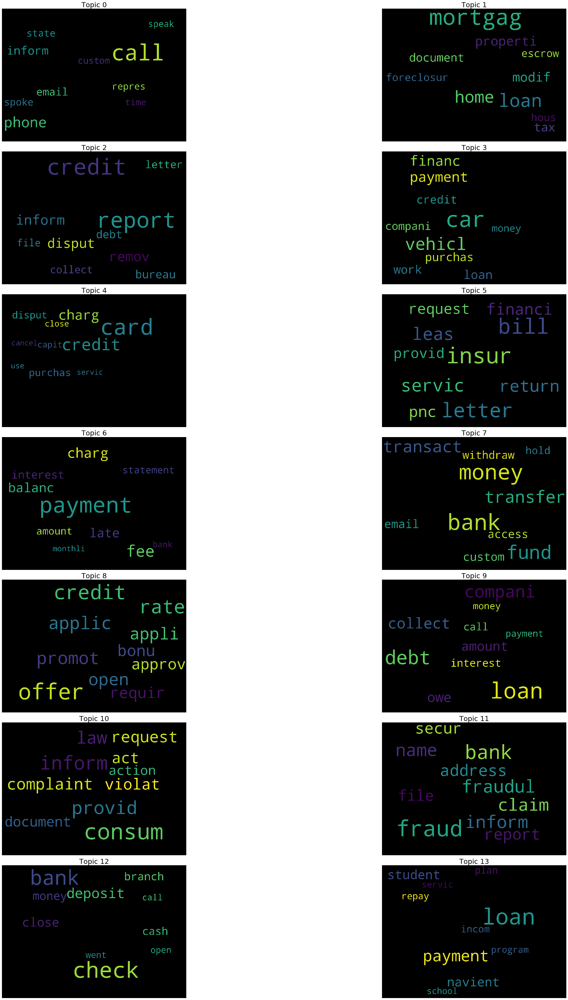

In [225]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.BASE_COLORS.items()]

cloud = WordCloud(stopwords=stop_words,
                  width=2500,
                  height=1800,
                  max_words=10,
                  #colormap='tab10',
                  #color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model14.show_topics(num_topics=lda_model14.num_topics, formatted=False,)

fig, axes = plt.subplots(7, 2, figsize=(50,50), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=25))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

At this point, a field expert could be able to help label these topics. 

For instance: 

* Topic 0 has keywords 'call, spoke, speak, phone, email, ...'. These are all words related to **communication**.
* Topic 1 has keywords 'mortgage, loan, home, house, foreclosure, property, ...'. These are all words related to **housing or property sales/mortgages**.
* Topic 2 has keywords 'credit, dispute, letter, report, file, collect, debt, bureau, ...'. These are all words related to **credit reporting**.
* Topic 3 has keywords 'car, vehicle, payment, credit, loan, purchase, money, ...'. These are all words related to **auto loan or dealership**.
* Topic 4 has keywords 'card, credit, charge, dispute, capital, cancel, use, purchase, ...'. These are all words related to **credit and debit cards**.
* Topic 5 has keywords 'bill, insurance, letter, provide, service, financial, request, return, lease, ...'. These words seem less related, but perhaps the topic here could be **insurance**.
* Topic 6 could be about **late payments**.
* Topic 7 could be about **customer service**.
* Topic 8 could be about **credit score**.
* Topic 9 could be about **loans**.
* Topic 10 could be about **legal actions**.
* Topic 11 could be about **fraud**.
* Topic 12 could be about **funds and deposits**.
* Topic 13 could be about **student loans**.

### Dominant topic and its percentage contribution to each document

Each document (or complaint) is composed of multiple topics. But typically only one of the topics is dominant. Let's extract this dominant topic for each complaint and show the weight of the topic and the keywords in a formatted output. This way, we know which document belongs predominantly to which topic.

Let's use the LDA model with 14 topics as an example.

In [ ]:
df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df.head()

In [ ]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    complaints_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                complaints_topics_df = complaints_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    complaints_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    complaints_topics_df = pd.concat([complaints_topics_df, contents], axis=1)
    
    return(complaints_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model14, corpus=corpus, texts=df['Consumer complaint narrative'].reset_index())

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)


In [ ]:
df_dominant_topic.shape